In [ ]:
!nvidia-smi

Thu May 18 00:56:55 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

- pytorch 1.13+ CUDA 116 환경으로 Colab 커널 downgrade

In [ ]:
!pip install torch==1.13.0+cu116 torchvision==0.14.0+cu116 --extra-index-url https://download.pytorch.org/whl/cu116

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu116
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 GB 833.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.2/24.2 MB 44.7 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.0.0+cu118
    Uninstalling torch-2.0.0+cu118:
      Successfully uninstalled torch-2.0.0+cu118
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.15.1+cu118
    Uninstalling torchvision-0.15.1+cu118:
      Successfully uninstalled torchvision-0.15.1+cu118
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.0.1+cu118 requires torch==2.0.0, but you have torch 1.13.0+cu116 which is incompatible.
torchdata 0.6.0 requires torch==2.0.0, but you have torch 1.13.0+

- Install MMCV using MIM

In [ ]:
!pip3 install openmim
!mim install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu116/torch1.13/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 6.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu116/torch1.13/index.html, https://download.openmmlab.com/mmcv/dist/cu116/torch1.13.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 MB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.9/200.9 kB 12.7 MB/s eta 0:00:00


- Install MMDetection from the source

In [ ]:
# mmdetection 2.x branch 로 설치
!git clone --branch 2.x https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 36093, done.
remote: Counting objects: 100% (744/744), done.
remote: Compressing objects: 100% (401/401), done.
remote: Total 36093 (delta 375), reused 603 (delta 334), pack-reused 35349
Receiving objects: 100% (36093/36093), 52.18 MiB | 12.94 MiB/s, done.
Resolving deltas: 100% (25308/25308), done.
/content/mmdetection
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmdetection
  Preparing metadata (setup.py) ... done
  Running setup.py develop for mmdet


- Verification

In [ ]:
import mmdet
print(mmdet.__version__)

2.28.2


/usr/local/lib/python3.10/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


- Inference

In [ ]:
!mim download mmdet --config yolov3_mobilenetv2_320_300e_coco --dest .

/usr/local/lib/python3.10/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
processing yolov3_mobilenetv2_320_300e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MiB 45.6 MB/s eta 0:00:00
Successfully downloaded yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth to /content/mmdetection
Successfully dumped yolov3_mobilenetv2_320_300e_coco.py to /content/mmdetection


In [ ]:
from mmdet.apis import init_detector, inference_detector

config_file = 'yolov3_mobilenetv2_320_300e_coco.py'
checkpoint_file = 'yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth'
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or device='cpu'
result = inference_detector(model, 'demo/demo.jpg')
len(result)

load checkpoint from local path: yolov3_mobilenetv2_320_300e_coco_20210719_215349-d18dff72.pth


80

In [ ]:
import os
import glob
import shutil
import pandas as pd
import mmcv
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split
from mmdet.datasets.builder import DATASETS
from mmdet.datasets.coco import CocoDataset
from mmcv import Config

# Train A Detector on A Customized Dataset

**LISA Traffic Light Dataset 다운로드**

In [ ]:
!pip install kaggle
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# permmision warning 방지
!chmod 600 ~/.kaggle/kaggle.json

# download the data
!kaggle datasets download -d mbornoe/lisa-traffic-light-dataset

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Saving kaggle.json to kaggle.json
100% 4.21G/4.21G [03:41<00:00, 22.9MB/s]
100% 4.21G/4.21G [03:41<00:00, 20.4MB/s]


In [ ]:
!mkdir lisa-traffic-light-dataset
# unzip
!unzip -q lisa-traffic-light-dataset.zip -d lisa-traffic-light-dataset

**Dataset의 디렉토리 구조 보기**

In [ ]:
# # install tree first
# !apt-get -q install tree

Reading package lists...
Building dependency tree...
Reading state information...
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 24 not upgraded.
Need to get 43.0 kB of archives.
After this operation, 115 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 tree amd64 1.8.0-1 [43.0 kB]
Fetched 43.0 kB in 1s (42.7 kB/s)
Selecting previously unselected package tree.
(Reading database ... 122531 files and directories currently installed.)
Preparing to unpack .../tree_1.8.0-1_amd64.deb ...
Unpacking tree (1.8.0-1) ...
Setting up tree (1.8.0-1) ...
Processing triggers for man-db (2.9.1-1) ...


In [ ]:
!pwd

/content/mmdetection


In [ ]:
# !tree ./lisa-traffic-light-dataset/Annotations

## 이미지 폴더 생성
- dayTrain : Train
- daySequence1 : valid
- daySequence2 : test

**이미지 파일 갯수**

In [ ]:
def count_files(path):
    count = 0
    for root, dirs, files in os.walk(path):
        count += len(files)
    return count

In [ ]:
# dayTrain img 파일
path = './lisa-traffic-light-dataset/dayTrain/'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in ./lisa-traffic-light-dataset/dayTrain/: 14035


In [ ]:
# # nightTrain img 파일
# path = './lisa-traffic-light-dataset/nightTrain/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [ ]:
# daySequence1 img 파일
path = './lisa-traffic-light-dataset/daySequence1/'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in ./lisa-traffic-light-dataset/daySequence1/: 4061


In [ ]:
# # nightSequence1 img 파일
# path = './lisa-traffic-light-dataset/nightSequence1/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

In [ ]:
# daySequence2 img 파일
path = './lisa-traffic-light-dataset/daySequence2/'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in ./lisa-traffic-light-dataset/daySequence2/: 6895


In [ ]:
# # nightSequence2 img 파일
# path = './lisa-traffic-light-dataset/nightSequence2/'
# count = count_files(path)
# print(f'Total number of files in {path}: {count}')

**train, valid, test 이미지 폴더 만들기**

In [ ]:
!mkdir lisa_train
!mkdir lisa_val
!mkdir lisa_test

## annotation csv 파일 합치기

In [ ]:
DATA_PATH = './lisa-traffic-light-dataset/'

DAY_TRAIN_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/dayTrain/'
# NIGHT_TRAIN_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/nightTrain/'

import os

os.listdir(DAY_TRAIN_PATH)

from tqdm import tqdm

train_day = []
for clipName in tqdm(sorted(os.listdir(DAY_TRAIN_PATH))):
    if 'dayClip' not in clipName:
        continue
    df = pd.read_csv(os.path.join(DAY_TRAIN_PATH, clipName, 'frameAnnotationsBOX.csv'), sep=';')
    # df = df[df['Origin frame number'] % 10 == 0]
    train_day.append(df)
    
train_df = pd.concat(train_day, axis=0)
# train_day_df['isNight'] = 0
    
# train_night = []
# for clipName in tqdm(sorted(os.listdir(NIGHT_TRAIN_PATH))):
#     if 'nightClip' not in clipName:
#         continue
#     df = pd.read_csv(os.path.join(NIGHT_TRAIN_PATH, clipName, 'frameAnnotationsBOX.csv'), sep=';')
#     # df = df[df['Origin frame number'] % 10 == 0]
#     train_night.append(df)

# train_night_df = pd.concat(train_night, axis=0)
# train_night_df['isNight'] = 1 # 밤을 구분하기 위함

# train_df = pd.concat([train_day_df, train_night_df], axis=0)
train_df = train_df.drop(['Origin file', 'Origin track', 'Origin track frame number'], axis=1)

# filename들이 다르게 설정되어 있기 때문에 그것을 해결하기 위한 작업
# Ex. dayTraining/dayClip1--00000.jpg -> dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg

def changeFilename(x):
    filename = x.Filename
    # isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    return os.path.join(DATA_PATH, f'dayTrain/dayTrain/{clipName}/frames/{splitted[-1]}')

    # if isNight:
    #     return os.path.join(DATA_PATH, f'nightTrain/nightTrain/{clipName}/frames/{splitted[-1]}')
    # else:
    #     return os.path.join(DATA_PATH, f'dayTrain/dayTrain/{clipName}/frames/{splitted[-1]}')

train_df['Filename'] = train_df.apply(changeFilename, axis=1)

def changeAnnotation(x):
    if 'go' in x['Annotation tag']:
        return 'go'
    # if 'goLeft' in x['Annotation tag']:
    #     return 'goLeft'
    # elif 'go' in x['Annotation tag']:
    #     return 'go'
    # elif 'goForward' in x['Annotation tag']:
    #     return 'go'
    elif 'warning' in x['Annotation tag']:
        return 'warning'
    elif 'stop' in x['Annotation tag']:
        return 'stop'
    
train_df['Annotation tag'] = train_df.apply(changeAnnotation, axis=1)
train_df, _ = train_test_split(train_df, train_size=0.4, random_state = 42, stratify = train_df['Annotation tag'])

train_df.to_csv('training_data.csv', index=False)

print(f'Finished processing {train_df.shape[0]} rows')
pd.set_option('display.max_colwidth', None)
train_df.head()

100%|██████████| 13/13 [00:00<00:00, 150.20it/s]


Finished processing 15124 rows


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number
6327,./lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip5/frames/dayClip5--01753.jpg,go,919,120,967,210,1753
1252,./lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip8/frames/dayClip8--00571.jpg,go,570,165,615,245,571
350,./lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip13/frames/dayClip13--00175.jpg,warning,620,219,653,255,175
5921,./lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip5/frames/dayClip5--01617.jpg,stop,717,127,777,212,1617
3013,./lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip5/frames/dayClip5--00648.jpg,stop,1136,188,1172,264,648


In [ ]:
duplicated_names = len(train_df['Filename'][train_df['Filename'].duplicated()].unique())
print('train 중복된 파일 종류: ', duplicated_names)

dup_count = len(train_df[train_df.duplicated(subset='Filename', keep=False)])
print('train 중복된 파일 갯수: ', dup_count)

train 중복된 파일 종류:  4226
train 중복된 파일 갯수:  9764


In [ ]:
train_df['Annotation tag'].unique()

array(['go', 'warning', 'stop'], dtype=object)

In [ ]:
DATA_PATH = './lisa-traffic-light-dataset/'

DAY_SEQ1_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/daySequence1/'
# NIGHT_SEQ1_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/nightSequence1/'

import os

os.listdir(DAY_SEQ1_PATH)

from tqdm import tqdm

valid_day = []
# for clipName in tqdm(sorted(os.listdir(DAY_SEQ1_PATH))):
#     if 'dayClip' not in clipName:
#         continue
df = pd.read_csv(os.path.join(DAY_SEQ1_PATH, 'frameAnnotationsBOX.csv'), sep=';')
# df = df[df['Origin frame number'] % 10 == 0]
valid_day.append(df)
    
valid_df = pd.concat(valid_day, axis=0)
# valid_day_df['isNight'] = 0
    
# valid_night = []
# # for clipName in tqdm(sorted(os.listdir(NIGHT_SEQ1_PATH))):
# #     if 'nightClip' not in clipName:
# #         continue
# df = pd.read_csv(os.path.join(NIGHT_SEQ1_PATH, 'frameAnnotationsBOX.csv'), sep=';')
# # df = df[df['Origin frame number'] % 10 == 0]
# valid_night.append(df)

# valid_night_df = pd.concat(valid_night, axis=0)
# valid_night_df['isNight'] = 1 # 밤을 구분하기 위함

# valid_df = pd.concat([valid_day_df, valid_night_df], axis=0)
valid_df = valid_df.drop(['Origin file', 'Origin track', 'Origin track frame number'], axis=1)

# filename들이 다르게 설정되어 있기 때문에 그것을 해결하기 위한 작업
# Ex. dayTraining/dayClip1--00000.jpg -> dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg

def changeFilename(x):
    filename = x.Filename
    # isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    return os.path.join(DATA_PATH, f'daySequence1/daySequence1/frames/{splitted[-1]}')
    # if isNight:
    #     return os.path.join(DATA_PATH, f'nightSequence1/nightSequence1/frames/{splitted[-1]}')
    # else:
    #     return os.path.join(DATA_PATH, f'daySequence1/daySequence1/frames/{splitted[-1]}')

valid_df['Filename'] = valid_df.apply(changeFilename, axis=1)

def changeAnnotation(x):
    if 'go' in x['Annotation tag']:
        return 'go'
    # if 'goLeft' in x['Annotation tag']:
    #     return 'goLeft'
    # elif 'go' in x['Annotation tag']:
    #     return 'go'
    # elif 'goForward' in x['Annotation tag']:
    #     return 'go'
    elif 'warning' in x['Annotation tag']:
        return 'warning'
    elif 'stop' in x['Annotation tag']:
        return 'stop'
    
valid_df['Annotation tag'] = valid_df.apply(changeAnnotation, axis=1)
valid_df, _ = train_test_split(valid_df, train_size=0.4, random_state = 42, stratify = valid_df['Annotation tag'])

valid_df.to_csv('valid_data.csv', index=False)

print(f'Finished processing {valid_df.shape[0]} rows')
pd.set_option('display.max_colwidth', None)
valid_df.head(3)

Finished processing 3160 rows


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number
5516,./lisa-traffic-light-dataset/daySequence1/daySequence1/frames/daySequence1--02806.jpg,go,759,324,780,354,2806
5074,./lisa-traffic-light-dataset/daySequence1/daySequence1/frames/daySequence1--02665.jpg,go,646,444,658,464,2665
2779,./lisa-traffic-light-dataset/daySequence1/daySequence1/frames/daySequence1--01334.jpg,go,554,278,575,318,1334


In [ ]:
duplicated_names = len(valid_df['Filename'][valid_df['Filename'].duplicated()].unique())
print('valid 중복된 파일 종류: ', duplicated_names)

dup_count = len(valid_df[valid_df.duplicated(subset='Filename', keep=False)])
print('valid 중복된 파일 갯수: ', dup_count)

valid 중복된 파일 종류:  779
valid 중복된 파일 갯수:  1703


In [ ]:
valid_df['Annotation tag'].unique()

array(['go', 'warning', 'stop'], dtype=object)

In [ ]:
DATA_PATH = './lisa-traffic-light-dataset/'

DAY_SEQ2_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/daySequence2/'
# NIGHT_SEQ2_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/nightSequence2/'

import os

os.listdir(DAY_SEQ2_PATH)

from tqdm import tqdm

test_day = []
# for clipName in tqdm(sorted(os.listdir(DAY_SEQ1_PATH))):
#     if 'dayClip' not in clipName:
#         continue
df = pd.read_csv(os.path.join(DAY_SEQ2_PATH, 'frameAnnotationsBOX.csv'), sep=';')
# df = df[df['Origin frame number'] % 10 == 0]
test_day.append(df)
    
test_df = pd.concat(test_day, axis=0)
# test_day_df['isNight'] = 0
    
# test_night = []
# # for clipName in tqdm(sorted(os.listdir(NIGHT_SEQ1_PATH))):
# #     if 'nightClip' not in clipName:
# #         continue
# df = pd.read_csv(os.path.join(NIGHT_SEQ2_PATH, 'frameAnnotationsBOX.csv'), sep=';')
# # df = df[df['Origin frame number'] % 10 == 0]
# test_night.append(df)

# test_night_df = pd.concat(test_night, axis=0)
# test_night_df['isNight'] = 1 # 밤을 구분하기 위함

# test_df = pd.concat([test_day_df, test_night_df], axis=0)
test_df = test_df.drop(['Origin file', 'Origin track', 'Origin track frame number'], axis=1)

# filename들이 다르게 설정되어 있기 때문에 그것을 해결하기 위한 작업
# Ex. dayTraining/dayClip1--00000.jpg -> dayTrain/dayTrain/dayClip1/frames/dayClip1--00000.jpg

def changeFilename(x):
    filename = x.Filename
    # isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    return os.path.join(DATA_PATH, f'daySequence2/daySequence2/frames/{splitted[-1]}')
    # if isNight:
    #     return os.path.join(DATA_PATH, f'nightSequence2/nightSequence2/frames/{splitted[-1]}')
    # else:
    #     return os.path.join(DATA_PATH, f'daySequence2/daySequence2/frames/{splitted[-1]}')

test_df['Filename'] = test_df.apply(changeFilename, axis=1)

def changeAnnotation(x):
    if 'go' in x['Annotation tag']:
        return 'go'
    # if 'goLeft' in x['Annotation tag']:
    #     return 'goLeft'
    # elif 'go' in x['Annotation tag']:
    #     return 'go'
    # elif 'goForward' in x['Annotation tag']:
    #     return 'go'
    elif 'warning' in x['Annotation tag']:
        return 'warning'
    elif 'stop' in x['Annotation tag']:
        return 'stop'
    
test_df['Annotation tag'] = test_df.apply(changeAnnotation, axis=1)
test_df, _ = train_test_split(test_df, train_size=0.1, random_state = 42, stratify = test_df['Annotation tag'])

test_df.to_csv('test_data.csv', index=False)

print(f'Finished processing {df.shape[0]} rows')
pd.set_option('display.max_colwidth', None)
test_df.head(3)

Finished processing 10120 rows


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number
6975,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--05775.jpg,stop,935,348,950,370,5775
1570,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--01818.jpg,stop,528,340,540,358,1818
6723,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--05701.jpg,stop,935,349,950,367,5701


In [ ]:
duplicated_names = len(test_df['Filename'][test_df['Filename'].duplicated()].unique())
print('test 중복된 파일 종류: ', duplicated_names)

dup_count = len(test_df[test_df.duplicated(subset='Filename', keep=False)])
print('test 중복된 파일 갯수: ', dup_count)

test 중복된 파일 종류:  81
test 중복된 파일 갯수:  167


In [ ]:
test_df['Annotation tag'].unique()

array(['stop', 'go', 'warning'], dtype=object)

## img 파일 모으기

In [ ]:
len(train_df['Filename'])

15124

In [ ]:
# 복사할 이미지 파일이 들어있는 경로
img_folder = train_df['Filename']

# 복사할 이미지 파일의 대상 폴더 경로
target_folder = './lisa_train'

for img_file in img_folder:
    shutil.copy(img_file, target_folder)

In [ ]:
# lisa_train img 파일
path = './lisa_train'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in ./lisa_train: 9586


In [ ]:
len(valid_df['Filename'])

3160

In [ ]:
# 복사할 이미지 파일이 들어있는 경로
img_folder = valid_df['Filename']

# 복사할 이미지 파일의 대상 폴더 경로
target_folder = './lisa_val'

for img_file in img_folder:
    shutil.copy(img_file, target_folder)

In [ ]:
# lisa_val img 파일
path = './lisa_val'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in ./lisa_val: 2236


In [ ]:
len(test_df['Filename'])

1012

In [ ]:
# 복사할 이미지 파일이 들어있는 경로
img_folder = test_df['Filename']

# 복사할 이미지 파일의 대상 폴더 경로
target_folder = './lisa_test'

for img_file in img_folder:
    shutil.copy(img_file, target_folder)

In [ ]:
# lisa_test img 파일
path = './lisa_test'
count = count_files(path)
print(f'Total number of files in {path}: {count}')

Total number of files in ./lisa_test: 926


## csv to json

In [ ]:
train_df.values.tolist()[0]

['./lisa-traffic-light-dataset/dayTrain/dayTrain/dayClip5/frames/dayClip5--01753.jpg',
 'go',
 919,
 120,
 967,
 210,
 1753]

In [ ]:
import pandas as pd
import argparse
import json
import os
import re

# parser = argparse.ArgumentParser()
# parser.add_argument('folder_path', type=str, help='Dataset main folder RELATIVE path')
# args = parser.parse_args()
# DATASET_PATH = args.folder_path


def get_segmentation(upper_left_x, upper_left_y, lower_right_x, lower_right_y): # (x1, y1, x2(x4), y2(y1), x3(x1), y3(y4), x4, y4)
    # Vertices are: 
    # Upper left  -> both x y given
    # Upper right -> x is the same as lower right; y is the same as upper left
    # Lower left  -> x is the same as upper left;  y is the same as lower right
    # Lower right -> both x y given
    # Coordinates are counted from the upper left corner of the pic

    return [[
            upper_left_x, upper_left_y,
            lower_right_x, upper_left_y,
            lower_right_x, lower_right_y,
            upper_left_x, lower_right_y            
            ]]


def get_area(upper_left_x, upper_left_y, lower_right_x, lower_right_y):
    # Area is width * height
    # Width is lower_right_x - upper_left_x (right X - left X)
    # Height is upper_left_y - lower_right_y (upper Y - lower Y)
    # Height is negative because of the coordinates!

    return (lower_right_x - upper_left_x)*(lower_right_y - upper_left_y) # width * height


def get_bbox(upper_left_x, upper_left_y, lower_right_x, lower_right_y):
    # The COCO bounding box format is [top left x position, top left y position, width, height]
    # Top left x position is upper_left_x
    # Top left y position is upper_left_y
    # Width is lower_right_x - upper_left_x (right X - left X)
    # Height is upper_left_y - lower_right_y (upper Y - lower Y)
    # Height is negative because of the coordinates!

    return [upper_left_x, upper_left_y, (lower_right_x - upper_left_x), (lower_right_y - upper_left_y)] # x, y, width, height


def get_info():
    return {
        "description": "LISA Traffic Sign Dataset",
        "url": "http://cvrr.ucsd.edu/LISA/lisa-traffic-sign-dataset.html",
        "version": "2.0",
        "year": 2018
    }


def get_licenses():
    return [
        {
            "url": "https://creativecommons.org/licenses/by-nc-sa/4.0/",
            "id": 1,
            "name": "CC BY-NC-SA 4.0"
        }
    ]


def get_images(file_type):
    # Getting dataset root path
    lisa_path = './'
    # lisa_path = os.path.join(dir_path, DATASET_PATH)

    if file_type == 'train':
        folder = os.path.join(lisa_path, 'lisa_train')
    elif file_type == 'valid':
        folder = os.path.join(lisa_path, 'lisa_val')
    elif file_type == 'test':
        folder = os.path.join(lisa_path, 'lisa_test')

    images = []
    id = 0
    for f in os.listdir(folder):
        if f.endswith('.jpg'):
            images.append(
            {
                "license": 1,
                "file_name": f,
                "height": 960,
                "width": 1280,
                "id": id
            })
            id += 1

    return images


def get_categories(file_type):
    # Getting dataset root path
    lisa_path = './'
    # lisa_path = os.path.join(dir_path, DATASET_PATH)

    if file_type == 'train':
        df = pd.read_csv(os.path.join(lisa_path, 'training_data.csv'), 
            index_col=False)
    elif file_type == 'valid':
        df = pd.read_csv(os.path.join(lisa_path, 'valid_data.csv'), 
            index_col=False)
    elif file_type == 'test':
        df = pd.read_csv(os.path.join(lisa_path, 'test_data.csv'), 
            index_col=False)
 
    tags = df['Annotation tag'].unique().tolist()
    print('Tags len is: ' + str(len(tags)))

    categories = []
    for i, t in enumerate(tags, 1):
        categories.append(
            {"supercategory": "", "id": i, "name": t}
        )
    
    return categories


def get_annotations(images, categories, file_type):
    # Getting dataset root path
    lisa_path = './'
    # lisa_path = os.path.join(dir_path, DATASET_PATH)

    if file_type == 'train':
        df = pd.read_csv(os.path.join(lisa_path, 'training_data.csv'), 
            index_col=False)
    elif file_type == 'valid':
        df = pd.read_csv(os.path.join(lisa_path, 'valid_data.csv'), 
            index_col=False)
    elif file_type == 'test':
        df = pd.read_csv(os.path.join(lisa_path, 'test_data.csv'), 
            index_col=False)

    # Converting the dataframe into a list of lists
    data = df.values.tolist()

    # Each element in data is a 11-element list with the following fields:
    # 0. Filename
    # 1. Annotation tag
    # 2. Upper left corner X
    # 3. Upper left corner Y
    # 4. Lower right corner X 
    # 5. Lower right corner Y
    # 6. Origin file
    #  Origin frame number
    #  Origin track
    #  Origin track frame number


    annotations = []
    total = len(data)
    for i, d in enumerate(data, 1):

        # Getting image ID from images based on filename (d[0])
        # Since filename has the format dayTrain/dayClip1--00347.jpg we need to strip from the slash
        filename = d[0].rsplit('/')[-1]
        image_id = [i["id"] for i in images if i["file_name"].endswith(filename)][0]

        # Getting category ID from categories based on name (d[1])
        category_id = [c["id"] for c in categories if c["name"] == d[1]][0]

        segmentation = get_segmentation(d[2], d[3], d[4], d[5])
        area         = get_area(d[2], d[3], d[4], d[5])
        bbox         = get_bbox(d[2], d[3], d[4], d[5])

        annotations.append({
            "segmentation": segmentation, 
            "area": area,
            "iscrowd": 0,
            "image_id": image_id,
            "bbox": bbox,
            "category_id": category_id,
            "id": i 
        })
        print(f'Processed {i} of {total}')
    return annotations


def main():
    info = get_info()
    licenses = get_licenses()

    train_images = get_images(file_type='train')
    valid_images = get_images(file_type='valid')
    test_images = get_images(file_type='test')

    train_categories = get_categories(file_type='train')
    valid_categories = get_categories(file_type='valid')
    test_categories = get_categories(file_type='test')

    train_annotations = get_annotations(train_images, 
        train_categories, file_type='train')
    valid_annotations = get_annotations(valid_images, 
        valid_categories, file_type='valid')
    test_annotations = get_annotations(test_images, 
        test_categories, file_type='test')

    train_data = {
        "info": info,
        "licenses": licenses,
        "images": train_images,
        "annotations": train_annotations,
        "categories": train_categories
    }

    valid_data = {
        "info": info,
        "licenses": licenses,
        "images": valid_images,
        "annotations": valid_annotations,
        "categories": valid_categories
    }

    test_data = {
        "info": info,
        "licenses": licenses,
        "images": test_images,
        "annotations": test_annotations,
        "categories": test_categories
    }

    with open('instances_train.json', 'w', encoding='utf-8') as f:
        json.dump(train_data, f, ensure_ascii=False, indent=4)
    with open('instances_val.json', 'w', encoding='utf-8') as f:
        json.dump(valid_data, f, ensure_ascii=False, indent=4)
    with open('instances_test.json', 'w', encoding='utf-8') as f:
        json.dump(test_data, f, ensure_ascii=False, indent=4)

main()

**json 파일 확인하기**

In [ ]:
!sudo apt-get install jq

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libjq1 libonig5
The following NEW packages will be installed:
  jq libjq1 libonig5
0 upgraded, 3 newly installed, 0 to remove and 24 not upgraded.
Need to get 313 kB of archives.
After this operation, 1,062 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 libonig5 amd64 6.9.4-1 [142 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 libjq1 amd64 1.6-1ubuntu0.20.04.1 [121 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 jq amd64 1.6-1ubuntu0.20.04.1 [50.2 kB]
Fetched 313 kB in 2s (185 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 3.)
debconf: falling back to frontend: Readline

In [ ]:
!jq . ./instances_train.json > output.json

In [ ]:
!head -100 output.json

{
  "info": {
    "description": "LISA Traffic Sign Dataset",
    "url": "http://cvrr.ucsd.edu/LISA/lisa-traffic-sign-dataset.html",
    "version": "2.0",
    "year": 2018
  },
  "licenses": [
    {
      "url": "https://creativecommons.org/licenses/by-nc-sa/4.0/",
      "id": 1,
      "name": "CC BY-NC-SA 4.0"
    }
  ],
  "images": [
    {
      "license": 1,
      "file_name": "dayClip7--00193.jpg",
      "height": 960,
      "width": 1280,
      "id": 0
    },
    {
      "license": 1,
      "file_name": "dayClip2--00705.jpg",
      "height": 960,
      "width": 1280,
      "id": 1
    },
    {
      "license": 1,
      "file_name": "dayClip5--00328.jpg",
      "height": 960,
      "width": 1280,
      "id": 2
    },
    {
      "license": 1,
      "file_name": "dayClip8--00439.jpg",
      "height": 960,
      "width": 1280,
      "id": 3
    },
    {
      "license": 1,
      "file_name": "dayClip5--01755.jpg",
      "height": 960,
      "width": 1280,
      "id": 4
    },
    {
 

In [ ]:
# !tail -100 output.json

In [ ]:
!grep -n 'annotations' output.json

67119:  "annotations": [


In [ ]:
!sed -n '67119, 67140p' output.json

  "annotations": [
    {
      "segmentation": [
        [
          919,
          120,
          967,
          120,
          967,
          210,
          919,
          210
        ]
      ],
      "area": 4320,
      "iscrowd": 0,
      "image_id": 1337,
      "bbox": [
        919,
        120,
        48,
        90


## 이미지 보기

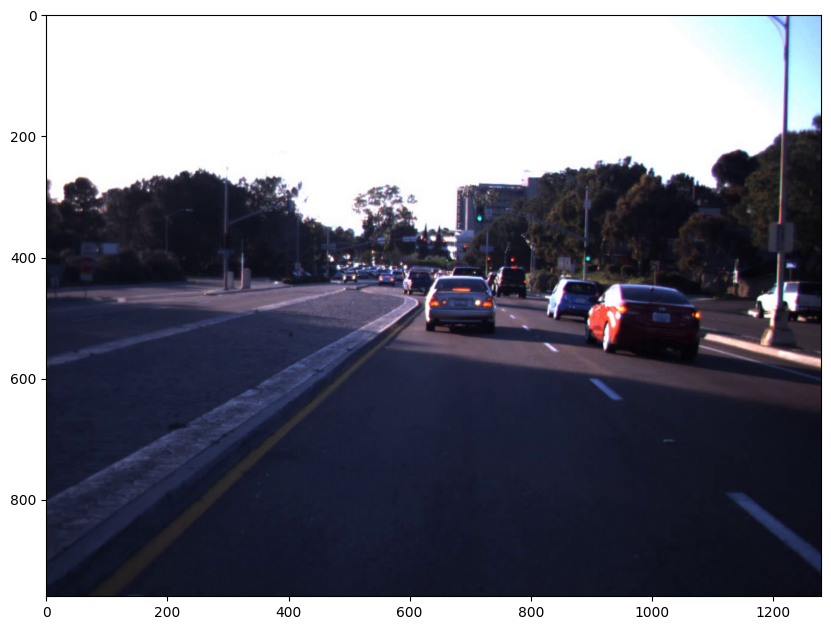

In [ ]:
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('./lisa_train/dayClip1--00020.jpg')
plt.figure(figsize=(10, 8))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

## pycocotools를 이용한 COCO 데이터 

In [ ]:
dataDir='./'
dataType='instances_train'
annFile='{}{}.json'.format(dataDir,dataType)
print(annFile)

./instances_train.json


**coco 객체 생성**

In [ ]:
from pycocotools.coco import COCO

# COCO 데이터셋의 어노테이션 파일을 통해 coco 객체 초기화

coco = COCO(annFile)

loading annotations into memory...
Done (t=0.33s)
creating index...
index created!


**category 정보**

In [ ]:
# getCatIds(): COCO 데이터셋의 모든 category_id 값을 리스트 형태로 반환
print(coco.getCatIds())
print(len(coco.getCatIds()))

[1, 2, 3]
3


In [ ]:
#loadCats() : category_id들을 리스트로 입력받아  category들에 대한 세부 정보 반환
cats = coco.loadCats(coco.getCatIds())
cats

[{'supercategory': '', 'id': 1, 'name': 'go'},
 {'supercategory': '', 'id': 2, 'name': 'warning'},
 {'supercategory': '', 'id': 3, 'name': 'stop'}]

In [ ]:
# coco.getCatIds()는 모든 category_id 리스트 반환
# coco.getCatIds(catIds=이름)는 지정된 이름에 대한 category id 반환

catIds = coco.getCatIds(catNms=['go'])
catIds

[1]

**image 정보**

In [ ]:
# coco.getImgIds(catIds=catIds) : 해당 catogory_id별로 한개의 image id을 임의로 출력
imgIds = coco.getImgIds(catIds=catIds)
imgIds

In [ ]:
#loadImgs(ids=imgIds) : 인자로 들어온 image id들에 대한 상세 정보 반환
imgs = coco.loadImgs(ids=imgIds)
len(imgs)

4003

In [ ]:
# 개별 image id로 상세 정보 추출
imgId = imgIds[0] # 8193
img = coco.loadImgs(ids=imgId) # 한 이미지에 대한 상세 정보
img

[{'license': 1,
  'file_name': 'dayClip5--01870.jpg',
  'height': 960,
  'width': 1280,
  'id': 8193}]

## 데이터 시각화

In [ ]:
img = img[0]
img['file_name']

'dayClip5--01870.jpg'

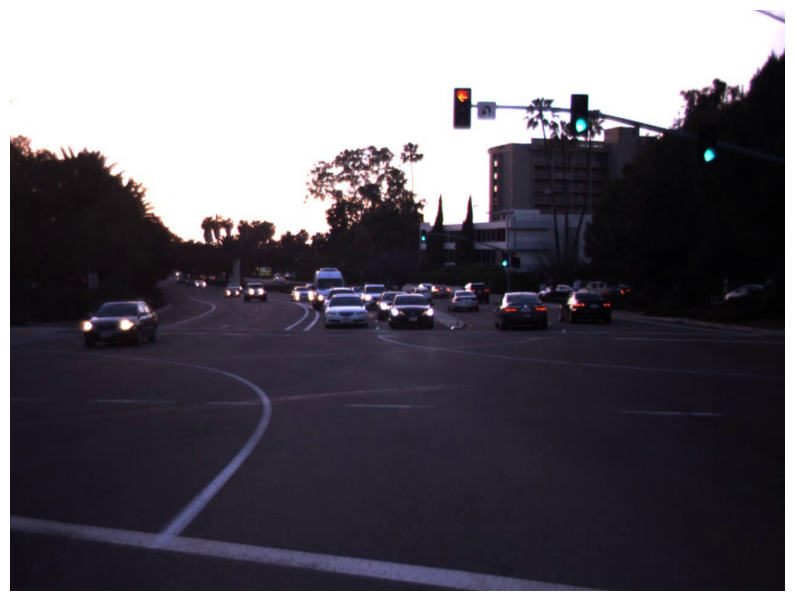

In [ ]:
import cv2
import matplotlib.pyplot as plt
import pylab
%matplotlib inline

file_path = './lisa_train/' + img['file_name']

image = cv2.imread(file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.axis('off')
plt.imshow(image)
plt.show()

In [ ]:
# getAnnIds() : 해당 image의 annotation을 가져오기
# 한 image는 여러 annotation 정보가 있음
coco.getAnnIds(imgIds=img['id'])

[2344, 6410]

In [ ]:
# 위의 코드에 catIds를 추가로 지정해 주면 해당 category의 annotation만 가져옴
catIds = coco.getCatIds(catNms=['go']) 
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds)
annIds

[2344]

In [ ]:
anns = coco.loadAnns(annIds)
len(anns)

1

In [ ]:
ann0_4seg= anns[0]['segmentation'][0]
ann0_4seg[:4] # x, y 좌표

[1123, 149, 1183, 149]

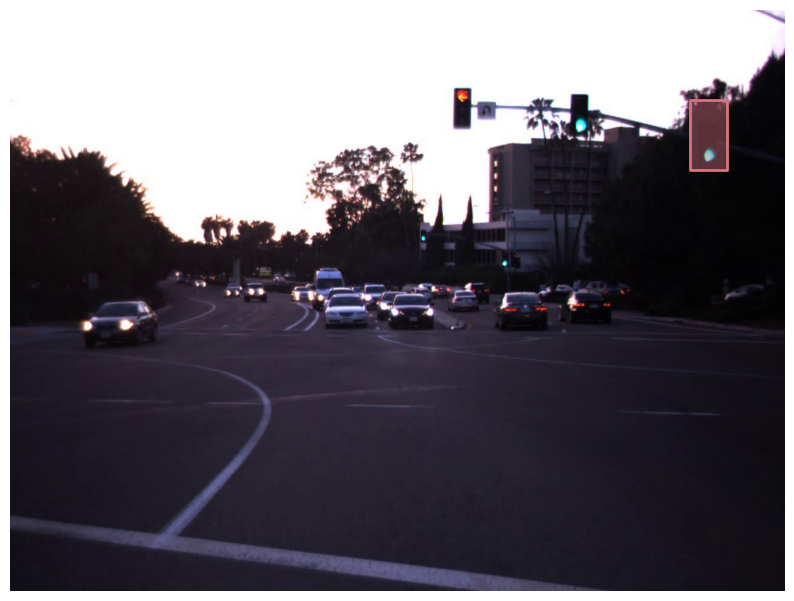

In [ ]:
# showAnns() : annotation 정보들을 입력받아서 시각화 
# 단, matplotlib으로 시각화 할 수 있는 이미지 배열이 로드되어 있어야 함
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.axis('off')
coco.showAnns(anns)

## lisa-traffic-light Dataset을 COCO Format으로 변환하기

In [ ]:
from mmdet.datasets.builder import DATASETS
from mmdet.datasets.coco import CocoDataset

@DATASETS.register_module(force=True) # 데코레이터를 통해 VOCDataset을 MMDetection FWK에 등록, 재등록 실패시 (force=True)
class LisaDataset(CocoDataset):   
  CLASSES = ('go', 'warning', 'stop')

**config 파일 수정하기**

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/mask_rcnn/mask_rcnn_r101_fpn_1x_coco.py')
print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='MaskRCNN',
    backbone=dict(
        type='ResNet',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained',
                      checkpoint='torchvision://resnet101')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='CrossEntropyLoss', us

**mask_rcnn pretrained model**

In [ ]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_fpn_1x_coco/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth \
      -O checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth

--2023-05-18 01:27:44--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r101_fpn_1x_coco/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.82.214, 163.181.82.219, 163.181.82.212, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|163.181.82.214|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 254089599 (242M) [application/octet-stream]
Saving to: ‘checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth’

checkpoints/mask_rc 100%[===================>] 242.32M  21.9MB/s    in 12s     

2023-05-18 01:27:56 (20.8 MB/s) - ‘checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth’ saved [254089599/254089599]



In [ ]:
# 학습 수행후 모델 checkpoint 저장할 공간 연결
# !mkdir /content/drive/MyDrive/lisa_log

In [ ]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'LisaDataset'
cfg.data_root = './'

cfg.data.test.type = 'LisaDataset'
cfg.data.test.data_root = './'
cfg.data.test.ann_file = 'instances_test.json'
cfg.data.test.img_prefix = 'lisa_test'
# cfg.data.test.pipeline = cfg.data.train.pipeline

cfg.data.train.type = 'LisaDataset'
cfg.data.train.data_root = './'
cfg.data.train.ann_file = 'instances_train.json'
cfg.data.train.img_prefix = 'lisa_train'

cfg.data.val.type = 'LisaDataset'
cfg.data.val.data_root = './'
cfg.data.val.ann_file = 'instances_val.json'
cfg.data.val.img_prefix = 'lisa_val'
# cfg.data.val.pipeline = cfg.data.train.pipeline

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
cfg.model.roi_head.mask_head.num_classes = 3

# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/lisa_log'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
# cfg.lr_config.warmup = None
cfg.log_config.interval = 10

# max epochs 12 
cfg.runner.max_epochs = 5 # 기본값 변경시에만 설정

# 학습 시 Batch size 설정(단일 GPU 별 Batch size로 설정됨)
# samples_per_gpu 2 
# cfg.data.samples_per_gpu = 2 # 기본값 변경시에만 설정

# Change the evaluation metric since we use customized dataset.
# note.
# detection evaluation에 map를 설정하면 iou가 0.5 일때만
# cocodata로 detection 할 때는 bbox를 설정해야 다양한 iou 기준 출력
# cocodata로 segmentation 할때는 bbox, segm을 지정
# CocoDataset의 경우 metric을 bbox로 설정해야 함.(mAP아님. bbox로 설정하면 mAP를 iou threshold를 0.5 ~ 0.95까지 변경하면서 측정)
cfg.evaluation.metric = ['bbox', 'segm']

# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 5
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 5

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.device = 'cuda'
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='MaskRCNN',
    backbone=dict(
        type='ResNet',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained',
                      checkpoint='torchvision://resnet101')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='CrossEntropyLoss', us

**Config에서 설정한 Lisa Dataset 적용**

In [ ]:
from mmdet.datasets import build_dataset

# Build dataset
train_dataset, test_dataset = [build_dataset(cfg.data.train), build_dataset(cfg.data.test)]

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [ ]:
train_dataset # 9586개의 train imgage


LisaDataset Train dataset with number of images 9586, and instance counts: 
+----------+-------+-------------+-------+----------+-------+----------+-------+----------+-------+
| category | count | category    | count | category | count | category | count | category | count |
+----------+-------+-------------+-------+----------+-------+----------+-------+----------+-------+
|          |       |             |       |          |       |          |       |          |       |
| 0 [go]   | 5872  | 1 [warning] | 418   | 2 [stop] | 8834  |          |       |          |       |
+----------+-------+-------------+-------+----------+-------+----------+-------+----------+-------+

In [ ]:
test_dataset # 926개의 test imgage


LisaDataset Train dataset with number of images 926, and instance counts: 
+----------+-------+-------------+-------+----------+-------+----------+-------+----------+-------+
| category | count | category    | count | category | count | category | count | category | count |
+----------+-------+-------------+-------+----------+-------+----------+-------+----------+-------+
|          |       |             |       |          |       |          |       |          |       |
| 0 [go]   | 696   | 1 [warning] | 300   | 2 [stop] | 16    |          |       |          |       |
+----------+-------+-------------+-------+----------+-------+----------+-------+----------+-------+

**Config에서 설정한 모델 적용**

In [ ]:
from mmdet.models import build_detector

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = train_dataset.CLASSES

## 학습 수행

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from mmdet.apis import train_detector

# Create work_dir
mmcv.mkdir_or_exist(os.path.abspath(cfg.work_dir))
train_detector(model, train_dataset, cfg, distributed=False, validate=True) # validate=True : validation 데이터로 evaluation

2023-05-18 01:29:09,015 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.


loading annotations into memory...


2023-05-18 01:29:09,324 - mmdet - INFO - load checkpoint from local path: checkpoints/mask_rcnn_r101_fpn_1x_coco_20200204-1efe0ed5.pth


Done (t=0.27s)
creating index...
index created!


2023-05-18 01:29:09,703 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([4]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([12, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([12]).
size mismatch for roi_head.mask_head.conv_logits.weight: copying a param with shape torch.Size([80, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([3, 256, 1, 1]).
size mismatch for roi_head.mask_head.conv_logits.bi

## 학습된 모델로 예측하기

**이미지 한 장 예측**

In [ ]:
# from mmdet.apis import init_detector, inference_detector

load checkpoint from local path: /content/drive/MyDrive/lisa_log/epoch_5.pth


/content/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


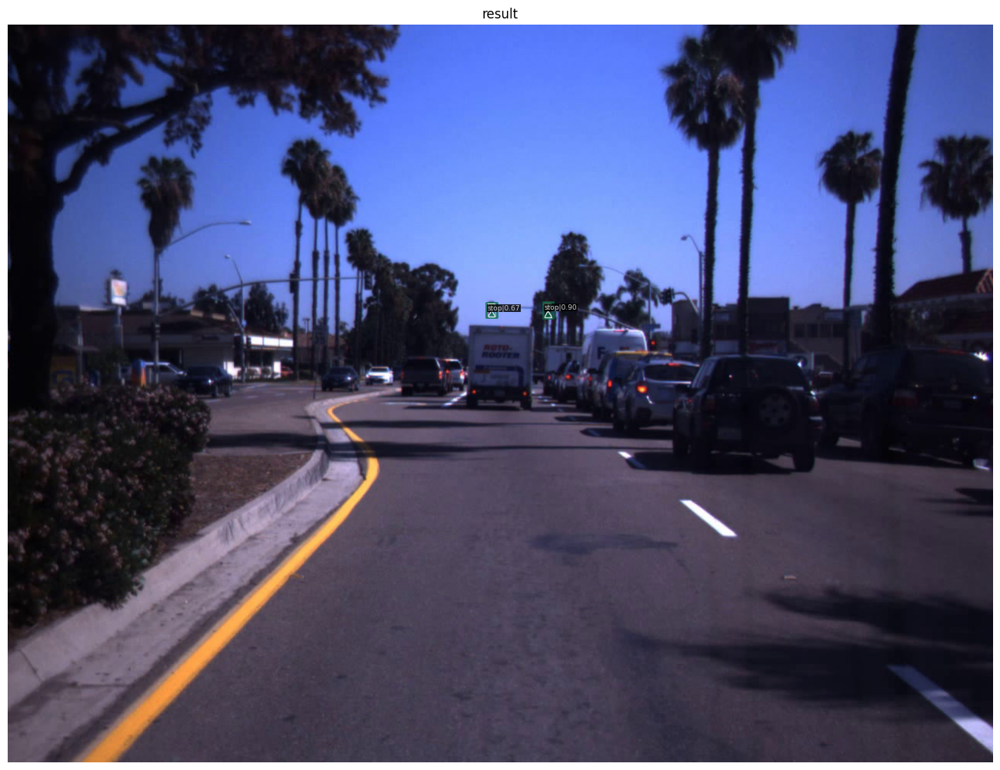

In [ ]:
# from mmdet.apis import show_result_pyplot

# # 저장된 모델로 이미지 예측
# checkpoint_file = '/content/drive/MyDrive/lisa_log/epoch_5.pth'

# model_ckpt = init_detector(cfg, checkpoint_file, device='cuda:0')
# img = mmcv.imread('./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00938.jpg') # BGR Image 사용 

# result = inference_detector(model_ckpt, img)
# show_result_pyplot(model_ckpt, img, result, score_thr=0.4)

In [ ]:
# len(result), type(result[0]), type(result[1])

(2, list, list)

In [ ]:
# len(result[0]), len(result[1])

(4, 4)

In [ ]:
# result[1]

[[],
 [array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]])],
 [],
 []]

In [ ]:
# result[0]

[array([], shape=(0, 5), dtype=float32),
 array([[6.9544238e+02, 3.6195963e+02, 7.0887451e+02, 3.8228705e+02,
         9.0454674e-01],
        [6.2198944e+02, 3.6219345e+02, 6.3565643e+02, 3.8195670e+02,
         6.6754150e-01]], dtype=float32),
 array([], shape=(0, 5), dtype=float32),
 array([], shape=(0, 5), dtype=float32)]

**이미지 여러 장 예측**

In [ ]:
# test_img_paths = test_df['Filename']
# test_img_paths

7              ./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00150.jpg
24             ./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg
25             ./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg
44             ./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg
45             ./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg
                                                    ...                                             
21097    ./lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequence2--06530.jpg
21098    ./lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequence2--06530.jpg
21099    ./lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequence2--06530.jpg
21100    ./lisa-traffic-light-dataset/nightSequence2/nightSequence2/frames/nightSequence2--

In [ ]:
# test_imgs = [mmcv.imread(x) for x in test_img_paths[:20]]

In [ ]:
# len(test_imgs), test_imgs[0].shape

(20, (960, 1280, 3))

In [ ]:
# test_df.head(6)

,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin frame number,isNight
7,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00150.jpg,stop,1004,349,1019,376,150,0
24,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg,stop,946,391,958,409,160,0
25,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00160.jpg,stop,834,345,852,372,160,0
44,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg,stop,723,340,741,367,170,0
45,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00170.jpg,stop,835,380,853,420,170,0
62,./lisa-traffic-light-dataset/daySequence2/daySequence2/frames/daySequence2--00180.jpg,stop,780,375,792,406,180,0


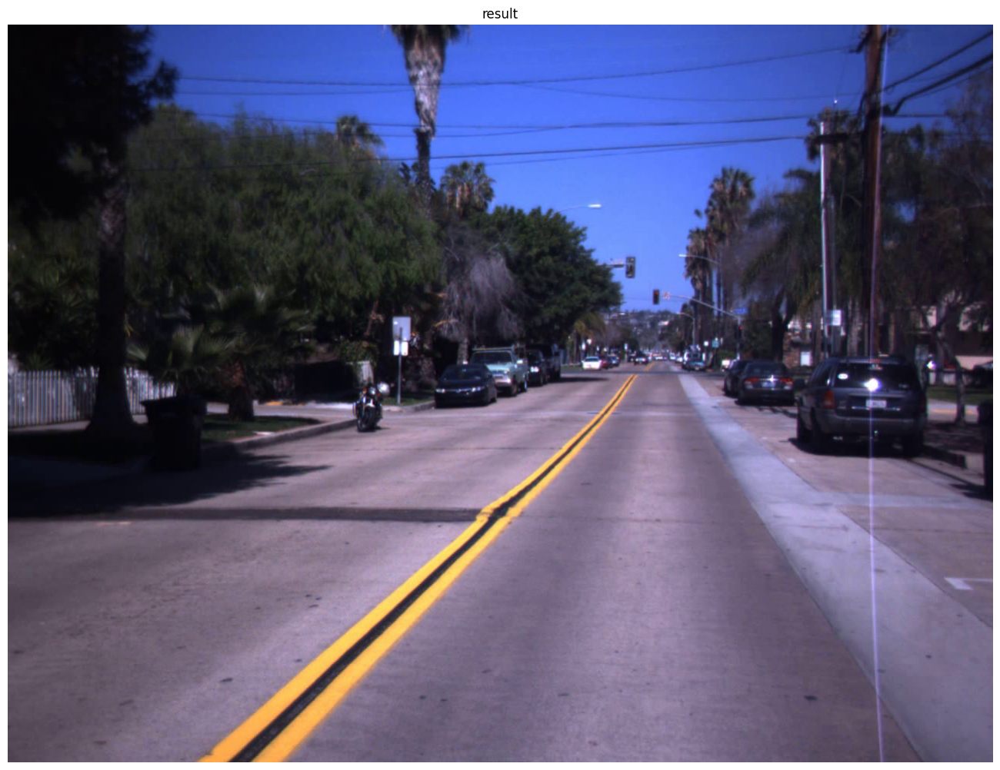

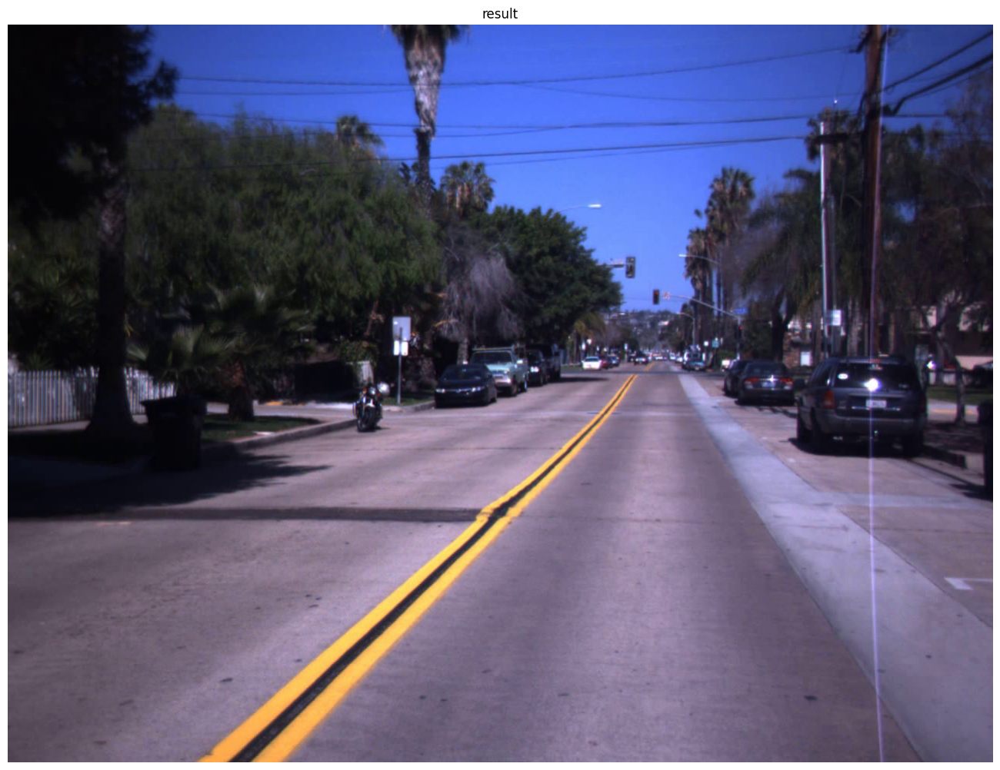

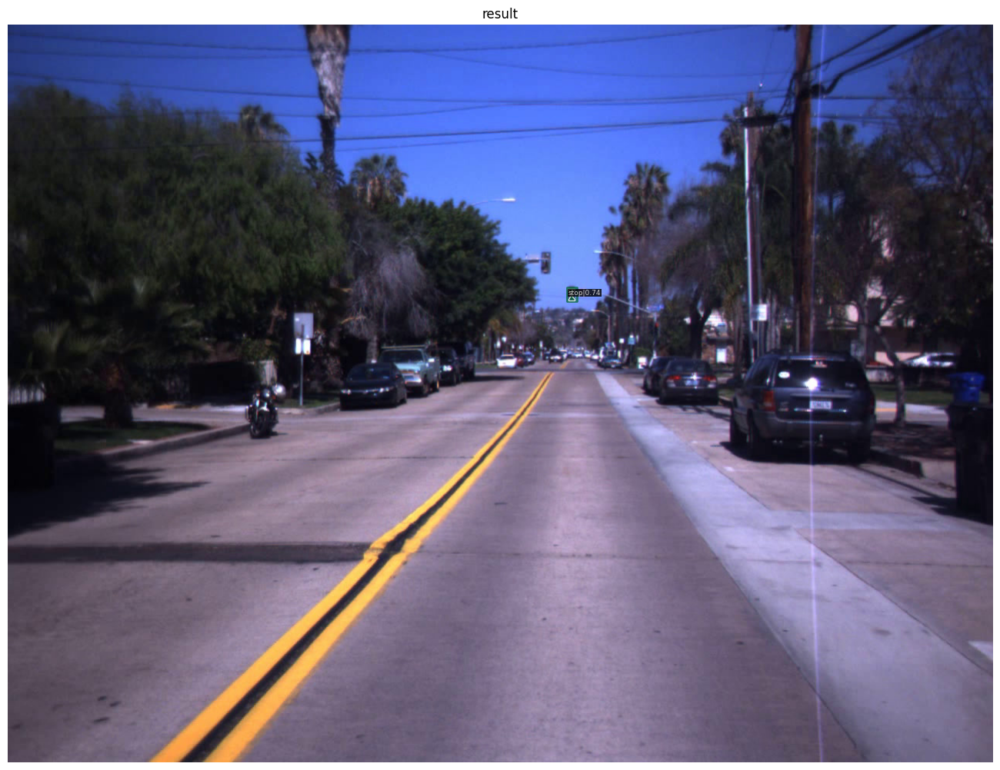

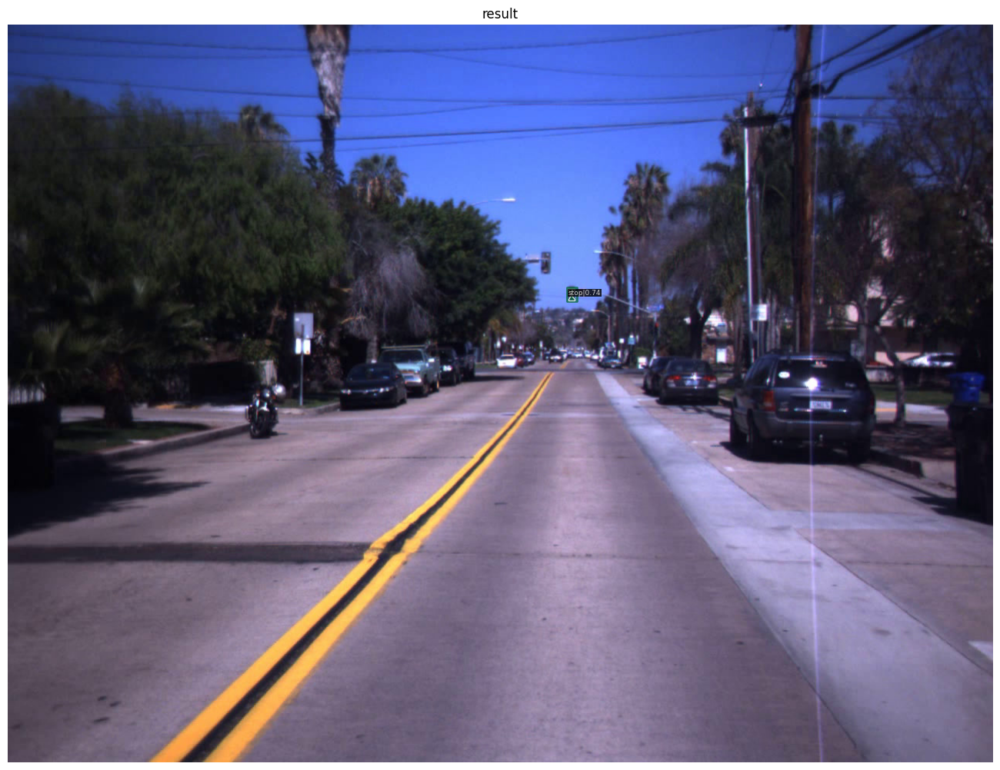

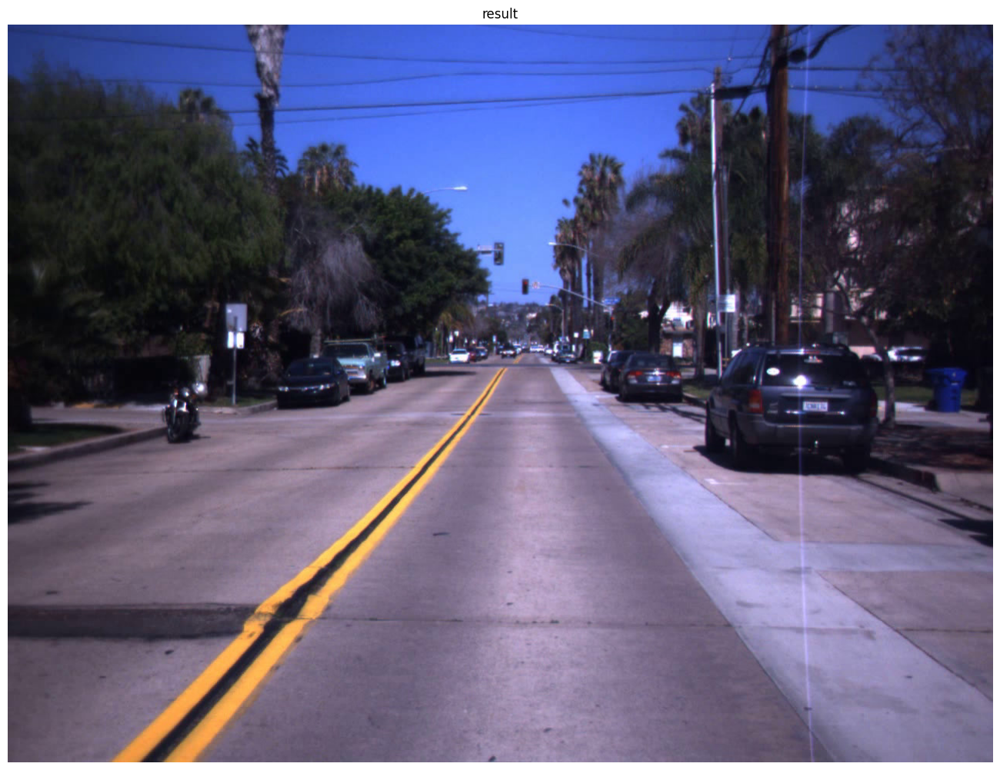

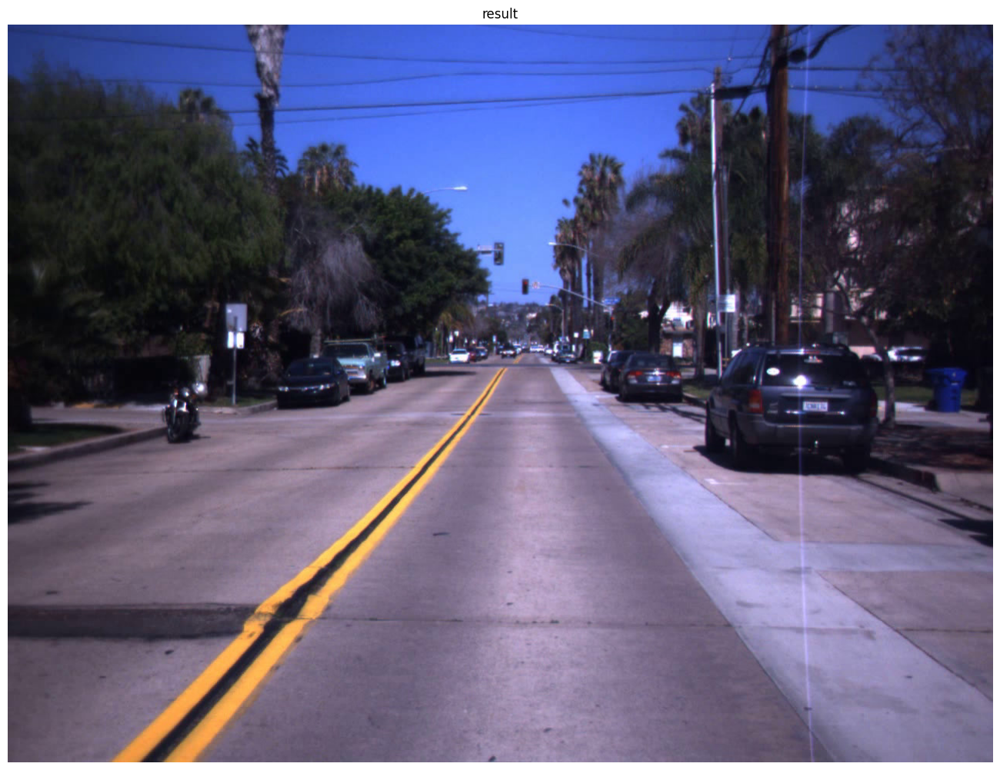

In [ ]:
# for i in range(1, 7):
#   result = inference_detector(model_ckpt, test_imgs[i])
#   show_result_pyplot(model_ckpt, test_imgs[i], result, score_thr=0.4)

## 모델 평가

In [ ]:
# test_dataset


LisaDataset Train dataset with number of images 1019, and instance counts: 
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| category | count | category | count | category    | count | category   | count | category      | count |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+
| 0 [go]   | 1807  | 1 [stop] | 1204  | 2 [warning] | 64    | 3 [goLeft] | 49    | -1 background | 0     |
+----------+-------+----------+-------+-------------+-------+------------+-------+---------------+-------+

In [ ]:
# from mmdet.datasets import build_dataloader, build_dataset

# # test용 Dataset과 DataLoader 생성. 
# data_loader = build_dataloader(
#         test_dataset,
#         samples_per_gpu=1, #cfg.data.samples_per_gpu,
#         workers_per_gpu=cfg.data.workers_per_gpu,
#         dist=False,
#         shuffle=False)

# x = next(iter(data_loader))

In [ ]:
# !mkdir show_test_output

In [ ]:
# x['img']

[tensor([[[[-2.1179, -2.1179, -2.1179,  ...,  0.0000,  0.0000,  0.0000],
           [-2.1179, -2.1179, -2.1179,  ...,  0.0000,  0.0000,  0.0000],
           [-2.1179, -2.1179, -2.1179,  ...,  0.0000,  0.0000,  0.0000],
           ...,
           [-2.0837, -2.0837, -2.0837,  ...,  0.0000,  0.0000,  0.0000],
           [-2.0837, -2.0837, -2.0837,  ...,  0.0000,  0.0000,  0.0000],
           [-2.0837, -2.0837, -2.0837,  ...,  0.0000,  0.0000,  0.0000]],
 
          [[-2.0357, -2.0357, -2.0357,  ...,  0.0000,  0.0000,  0.0000],
           [-2.0357, -2.0357, -2.0357,  ...,  0.0000,  0.0000,  0.0000],
           [-2.0357, -2.0357, -2.0357,  ...,  0.0000,  0.0000,  0.0000],
           ...,
           [-2.0357, -2.0357, -2.0357,  ...,  0.0000,  0.0000,  0.0000],
           [-2.0357, -2.0357, -2.0357,  ...,  0.0000,  0.0000,  0.0000],
           [-2.0357, -2.0357, -2.0357,  ...,  0.0000,  0.0000,  0.0000]],
 
          [[-1.8044, -1.8044, -1.8044,  ...,  0.0000,  0.0000,  0.0000],
           [-

In [ ]:
# from mmdet.apis import single_gpu_test
# from mmdet.utils import build_dp

# # 위에서 만든 /content/show_test_output 디렉토리에 예측 결과 이미지가 저장
# model_ckpt = build_dp(model_ckpt, cfg.device, device_ids=cfg.gpu_ids)
# results = single_gpu_test(model_ckpt, data_loader, True, '/content/show_test_output', 0.3)

[>>>>>>>>>>>>>>>>>>>>>>>>    ] 878/1019, 1.8 task/s, elapsed: 493s, ETA:    79s

In [ ]:
# metric = test_dataset.evaluate(results, metric=['bbox', 'segm'])
# print(metric)